# **Data Loading**

In [1]:
!pip install -q kaggle
from google.colab import files
files.upload()   # Upload kaggle.json from your Kaggle account
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d akhatova/pcb-defects
!unzip -q pcb-defects.zip -d ./pcb_defects

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/akhatova/pcb-defects
License(s): unknown
100% 1.88G/1.88G [00:14<00:00, 137MB/s] 



In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
import os
import random
import re
import shutil
sns.set_style('darkgrid')
sns.set_palette('pastel')
import warnings
warnings.filterwarnings('ignore')


## **Understanding the dataset**

In [3]:
input_dir= "pcb_defects/PCB_DATASET"
os.listdir(input_dir)

['Annotations', 'images', 'PCB_USED', 'rotate.py', 'rotation']

*  **PCB USED folder**- contains the 12 template images we used in the dataset.
* **images folder**- contains the PCB images subclassed into different types.
* **rotation folder**- contains the rotated PCB images subclassed into different types as well as rotation angle
* **annotations folder**- contains the annotations for bounding box of each images





## **Analyzing the PCB USED folder**

In [4]:
template_dir=os.path.join(input_dir,'PCB_USED')
template_dir

'pcb_defects/PCB_DATASET/PCB_USED'

In [5]:
#Creating function to visualize images:
def visualize_img(dir_name,nos_):
    k=1
    plt.figure(figsize=(8,(nos_//2)*6))
    for filename in os.listdir(dir_name)[0:nos_]:
        if filename.lower().endswith(('.jpg','.jpeg','.png')):
            ax=plt.subplot((nos_//2)+1,2,k)
            img_path=os.path.join(dir_name,filename)
            img=plt.imread(img_path)
            ax.imshow(img)
            ax.set_xlabel(filename)
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])
            k+=1
    plt.tight_layout()
    plt.show()

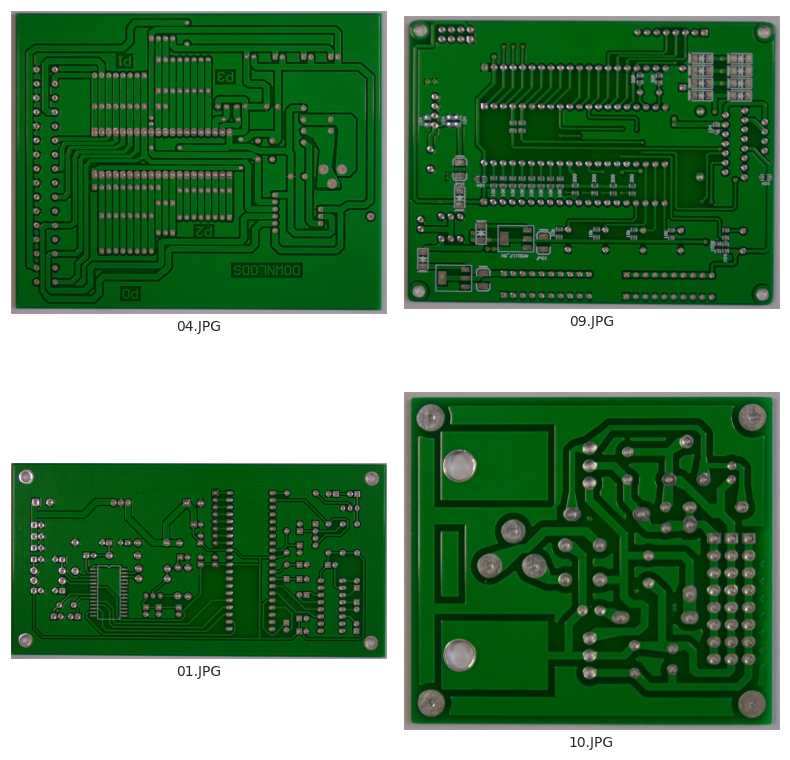

No of template images:10


In [6]:
visualize_img(template_dir,nos_=4)

print(f'No of template images:{len(os.listdir(template_dir))}')

## **Analyzing the images folder**

In [7]:
# Listing the types of defects
img_dir=os.path.join(input_dir,'images')
os.listdir(img_dir)
types_defect=os.listdir(os.path.join(input_dir,'images'))
types_defect

['Mouse_bite',
 'Spur',
 'Spurious_copper',
 'Open_circuit',
 'Short',
 'Missing_hole']

In [8]:
# Creating img_path list
img_path_list=[]
for sub_cat in types_defect:
    for file in os.listdir(os.path.join(img_dir,sub_cat)):

        img_path_list.append(os.path.join(img_dir,sub_cat,file))


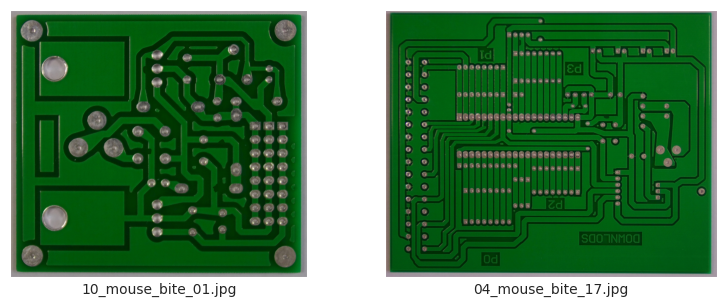

No of Mouse_bite images:115


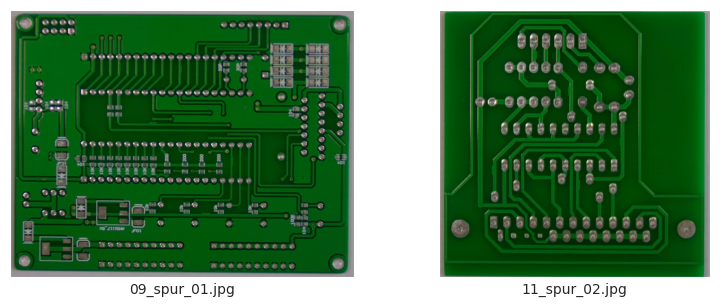

No of Spur images:115


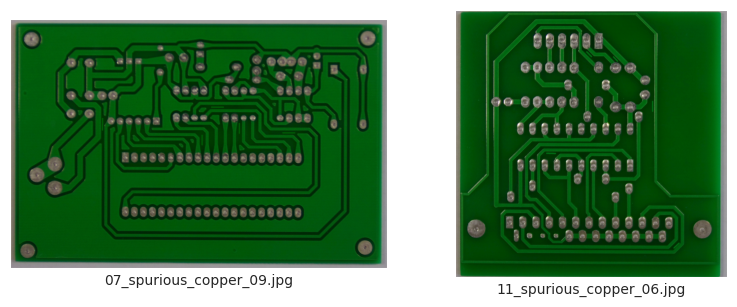

No of Spurious_copper images:116


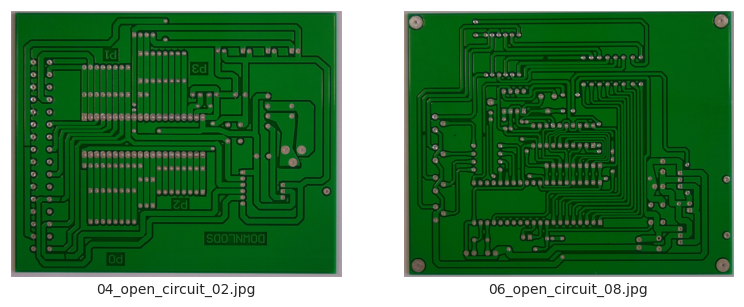

No of Open_circuit images:116


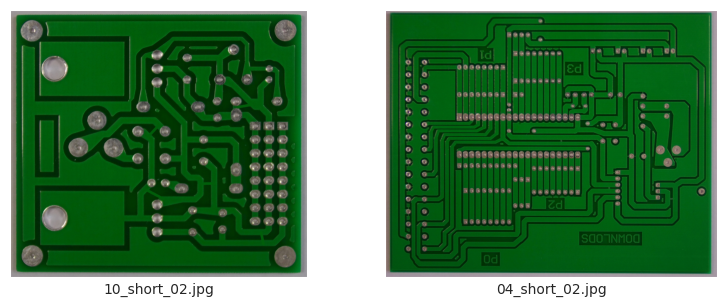

No of Short images:116


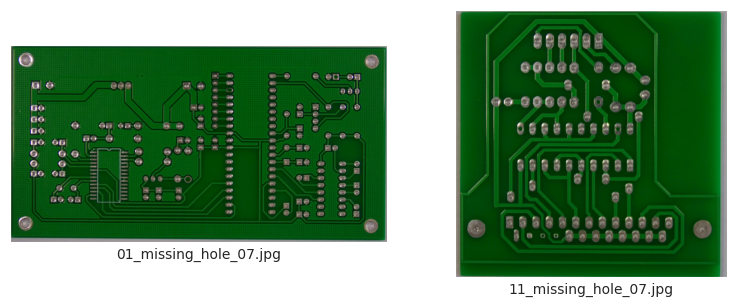

No of Missing_hole images:115


In [9]:
# Vizualizing defect images for each type

df_defect=pd.DataFrame(columns=['No of defect']) # dataframe for counting no of defects
for sub_cat in types_defect:
    visualize_img(os.path.join(img_dir,sub_cat),nos_=2)  #Visualizing 2 types of defect for each type

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(img_dir,sub_cat)))}')

    df_defect.loc[sub_cat]=len(os.listdir(os.path.join(img_dir,sub_cat)))


In [10]:
# No. of defects by type
df_defect

,No of defect
Mouse_bite,115
Spur,115
Spurious_copper,116
Open_circuit,116
Short,116
Missing_hole,115


## **Analyzing rotated folder**

In [11]:
rotated_dir=os.path.join(input_dir,'rotation')
os.listdir(rotated_dir)

['Spur_rotation',
 'Missing_hole_rotation',
 'Mouse_bite_rotation',
 'Mouse_bite_angles.txt',
 'Spurious_copper_rotation',
 'Spur_angles.txt',
 'Spurious_copper_angles.txt',
 'Open_circuit_angles.txt',
 'Short_angles.txt',
 'Short_rotation',
 'Open_circuit_rotation',
 'Missing_hole_angles.txt']

In [12]:
rotated_angle_list=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')]
rotated_angle_list

['Mouse_bite_angles.txt',
 'Spur_angles.txt',
 'Spurious_copper_angles.txt',
 'Open_circuit_angles.txt',
 'Short_angles.txt',
 'Missing_hole_angles.txt']

In [13]:
types_defect_rotated=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')==False]
types_defect_rotated

['Spur_rotation',
 'Missing_hole_rotation',
 'Mouse_bite_rotation',
 'Spurious_copper_rotation',
 'Short_rotation',
 'Open_circuit_rotation']

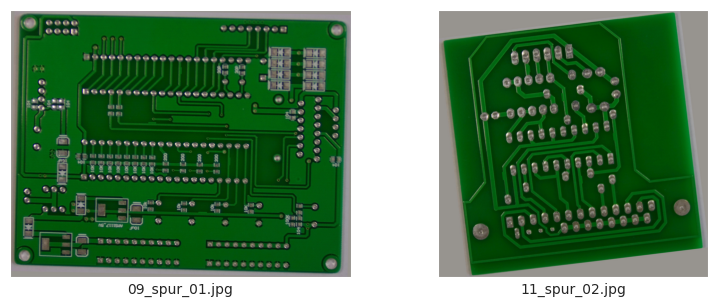

No of Spur_rotation images:115


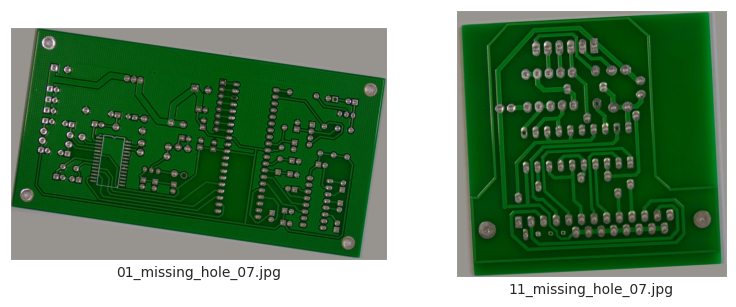

No of Missing_hole_rotation images:115


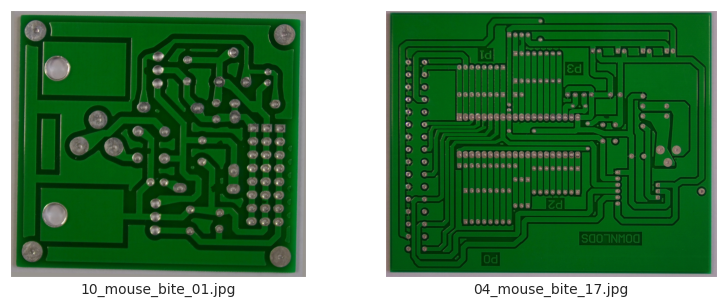

No of Mouse_bite_rotation images:115


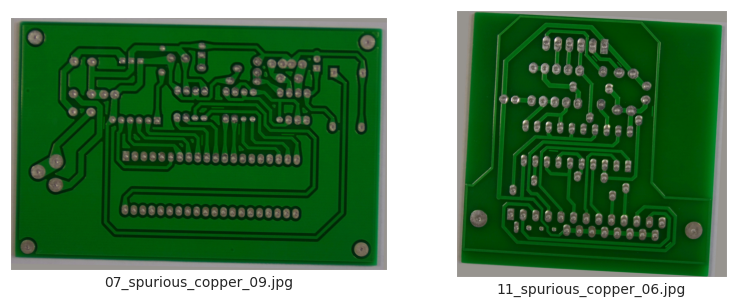

No of Spurious_copper_rotation images:116


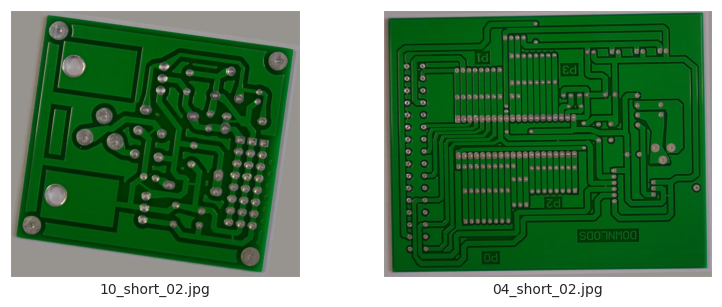

No of Short_rotation images:116


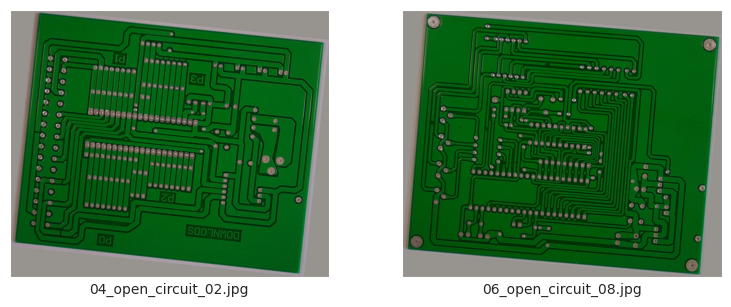

No of Open_circuit_rotation images:116


In [14]:
# Vizualizing rotated defects
df_defect_rotated=pd.DataFrame(columns=['No of defect'])
for sub_cat in types_defect_rotated:
    visualize_img(os.path.join(rotated_dir,sub_cat),nos_=2)

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(rotated_dir,sub_cat)))}')

    df_defect_rotated.loc[sub_cat]=len(os.listdir(os.path.join(rotated_dir,sub_cat)))

In [15]:
# No. of defects by type  rotated
df_defect_rotated

,No of defect
Spur_rotation,115
Missing_hole_rotation,115
Mouse_bite_rotation,115
Spurious_copper_rotation,116
Short_rotation,116
Open_circuit_rotation,116


In [16]:
# Reading the rotation text files

df_rotation_angle=pd.DataFrame(columns=['Line','Angle'])
for filename in rotated_angle_list:
    with open(os.path.join(rotated_dir,filename),'r') as f:
        lines=f.readlines()
        for line in lines:
            text,angle=line.split()
            df_rotation_angle=pd.concat([df_rotation_angle,pd.DataFrame({'Line':[text],'Angle':[angle]})],axis=0)


In [17]:
df_rotation_angle

,Line,Angle
0,04_mouse_bite_06,-4
0,12_mouse_bite_04,10
0,01_mouse_bite_17,10
0,04_mouse_bite_08,7
0,01_mouse_bite_01,-6
...,...,...
0,12_missing_hole_02,-10
0,05_missing_hole_06,-6
0,08_missing_hole_08,8
0,06_missing_hole_05,1


## **Analyzing the annotate folder**

In [18]:
annote_dir=os.path.join(input_dir,'Annotations')
annote_dir

'pcb_defects/PCB_DATASET/Annotations'

In [19]:
type_annot=os.listdir(annote_dir)
type_annot

['Mouse_bite',
 'Spur',
 'Spurious_copper',
 'Open_circuit',
 'Short',
 'Missing_hole']

In [20]:
# Checking the length of annotation items

df_annot_nos=pd.DataFrame(columns=['No of annotations'])
for i in type_annot:
    df_annot_nos.loc[i]=len(os.listdir(os.path.join(annote_dir,i)))
df_annot_nos

,No of annotations
Mouse_bite,115
Spur,115
Spurious_copper,116
Open_circuit,116
Short,116
Missing_hole,115


We see that we have an annotation file for each image

In [21]:
# Checking the type of files
file_list=os.listdir(os.path.join(annote_dir,'Mouse_bite'))
file_list[0:5]

['07_mouse_bite_09.xml',
 '04_mouse_bite_08.xml',
 '05_mouse_bite_04.xml',
 '06_mouse_bite_10.xml',
 '01_mouse_bite_10.xml']

We see that all files are in XML format, so we have to parse the data

In [22]:
# importing xml ET to parse xml file

import xml.etree.ElementTree as ET
tree = ET.parse(os.path.join(os.path.join(annote_dir,'Mouse_bite'),'01_mouse_bite_11.xml'))
root = tree.getroot()


In [23]:
# Getting the structure of XML file
print(ET.tostring(root, encoding='utf8').decode('utf8'))

<?xml version='1.0' encoding='utf8'?>
<annotation>
	<folder>Mouse_bite</folder>
	<filename>01_mouse_bite_11.jpg</filename>
	<path>/home/weapon/Desktop/PCB_DATASET/Mouse_bite/01_mouse_bite_11.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>3034</width>
		<height>1586</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1199</xmin>
			<ymin>966</ymin>
			<xmax>1234</xmax>
			<ymax>1004</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>2042</xmin>
			<ymin>755</ymin>
			<xmax>2073</xmax>
			<ymax>786</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1472</xmin>
			<ymin>607</ymin>
		

In [24]:
# Parsing XML to return Bounding box dimensions
def parse_xml(xml_file):

    data=[]

    tree = ET.parse(xml_file)
    root = tree.getroot()

    filename = root.find('filename').text
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)
    for obj in root.findall('object'):
        name = obj.find('name').text
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)

        data.append({
            'filename': filename,
            'width': width,
            'height': height,
            'class': name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
        })

    return data

In [25]:
# Retrieving data for all files
data=[]
all_data=[]

for x in type_annot:
    for file in os.listdir(os.path.join(annote_dir,x)):
        xml_file_path=os.path.join(os.path.join(annote_dir,x),file)
        data=parse_xml(xml_file_path)
        all_data.extend(data)


In [26]:
# Creating a dataframe to store the annotations
df_annot=pd.DataFrame(all_data)
df_annot

,filename,width,height,class,xmin,ymin,xmax,ymax
0,07_mouse_bite_09.jpg,2904,1921,mouse_bite,960,384,1025,469
1,07_mouse_bite_09.jpg,2904,1921,mouse_bite,1617,629,1696,686
2,07_mouse_bite_09.jpg,2904,1921,mouse_bite,1975,700,2044,777
3,07_mouse_bite_09.jpg,2904,1921,mouse_bite,2322,1015,2384,1112
4,07_mouse_bite_09.jpg,2904,1921,mouse_bite,879,877,929,948
...,...,...,...,...,...,...,...,...
2948,09_missing_hole_06.jpg,2775,2159,missing_hole,1712,540,1772,599
2949,09_missing_hole_06.jpg,2775,2159,missing_hole,2335,771,2413,838
2950,09_missing_hole_06.jpg,2775,2159,missing_hole,1182,1545,1243,1605
2951,09_missing_hole_06.jpg,2775,2159,missing_hole,561,1059,631,1120


In [27]:
import os
import shutil

# Path to the main images folder in Colab (already uploaded)
img_dir = "/content/pcb_defects/PCB_DATASET/images"


source_dirs = [
    os.path.join(img_dir, "Missing_hole"),
    os.path.join(img_dir, "Mouse_bite"),
    os.path.join(img_dir, "Open_circuit"),
    os.path.join(img_dir, "Short"),
    os.path.join(img_dir, "Spur"),
    os.path.join(img_dir, "Spurious_copper")
]

# Define the destination directory for the combined images
destination_dir = "/content/images_combined"

os.makedirs(destination_dir, exist_ok=True)

# Loop through each source directory and copy all files to the destination
for source_dir in source_dirs:
    if os.path.exists(source_dir):
        files = os.listdir(source_dir)
        for file in files:
            file_path = os.path.join(source_dir, file)
            if os.path.isfile(file_path):
                shutil.copy(file_path, destination_dir)
    else:
        print(f"Directory {source_dir} does not exist.")


In [28]:
# Now check how many files are in the destination folder
files_in_combined = os.listdir(destination_dir)
print(f"Number of files copied: {len(files_in_combined)}")

Number of files copied: 693


In [29]:
destination_dir

'/content/images_combined'

Text(0.5, 0, 'No of defects in one PCB')

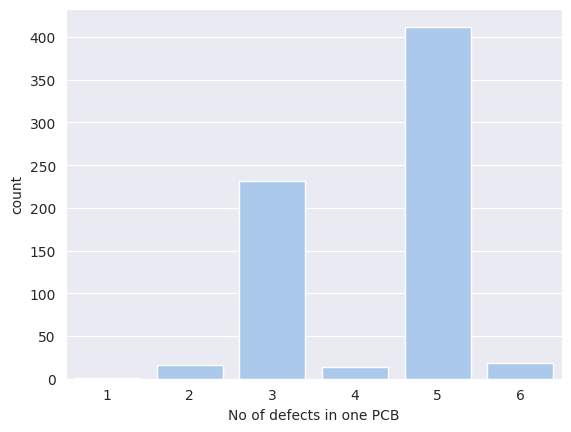

In [30]:
# Visualizing the no of defects in each pcb
df_multiple_defects=pd.DataFrame(df_annot['filename'].value_counts())
sns.countplot(df_multiple_defects,x='count')
plt.xlabel('No of defects in one PCB')

## **Applying Bounding Boxes**

In [31]:
# Defining a function to view image along with bounding box
# Draws multiple bounding boxes on an image using Matplotlib.

def draw_bounding_boxes(image_path, bounding_boxes,annotation):

    # Load the image
    img = plt.imread(image_path)

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(15,10))
    ax.imshow(img)

    # Draw each bounding box
    for bbox in bounding_boxes:
        min_x, min_y, max_x, max_y = bbox
        width = max_x - min_x
        height = max_y - min_y
        rect = patches.Rectangle((min_x, min_y), width, height, linewidth=1, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Calculate the centroid of the bounding box
        centroid_x = (min_x + max_x) / 2
        centroid_y = (min_y + max_y) / 2

        # Add the annotation to the centroid
        ax.annotate( annotation,(centroid_x,centroid_y),(max_x+20,max_y+20),
            fontsize=10,color='white',
            horizontalalignment='right', verticalalignment='top')

    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    # Show the plot
    plt.show()


In [32]:
# Getting filename from filepath
filepath=img_path_list[0]
filename=re.sub(r'.+/([\w_]+\.jpg)',r'\1',filepath)
filename

'10_mouse_bite_01.jpg'

In [33]:
def visualize_annotations(list_image_path, df):
    for i in list_image_path:
        filepath = i
        filename = re.sub(r'.+/([\w_]+\.jpg)', r'\1', filepath)
        df_selected = df[df['filename'] == filename]
        width  = df_selected['width'].values
        height = df_selected['height'].values

        # check if 'class' or 'class_name' exists
        if 'class_name' in df_selected.columns:
            class_name = df_selected['class_name'].values
        elif 'class' in df_selected.columns:
            class_name = df_selected['class'].values
        else:
            raise KeyError("No class column found in dataframe")

        xmin = df_selected['xmin'].values
        ymin = df_selected['ymin'].values
        xmax = df_selected['xmax'].values
        ymax = df_selected['ymax'].values

        bbox = zip(xmin, ymin, xmax, ymax)
        draw_bounding_boxes(filepath, bbox, class_name[0])


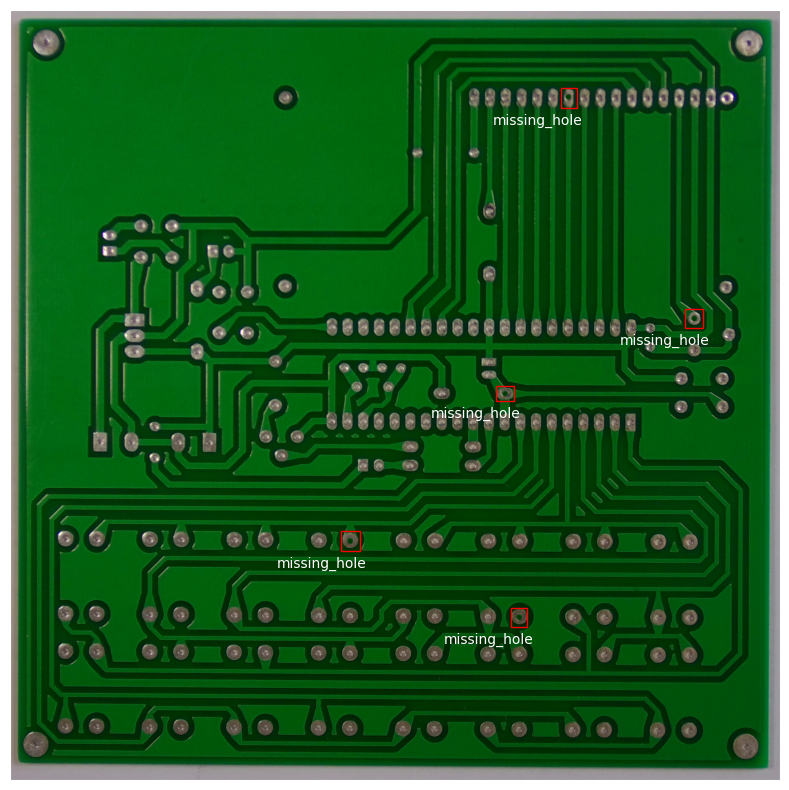

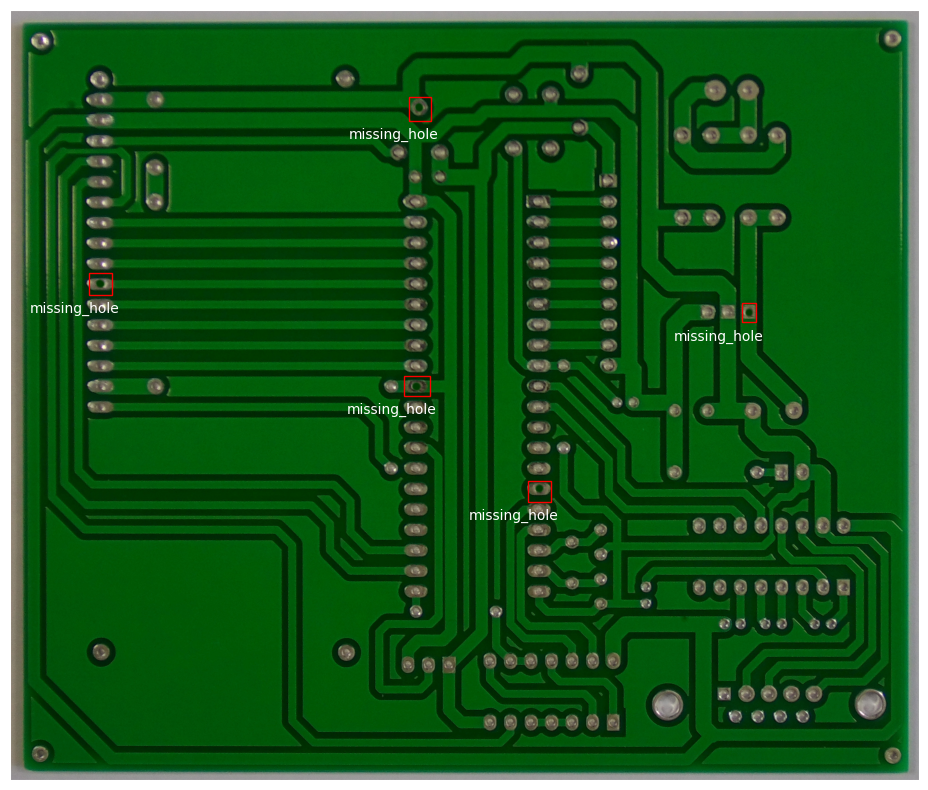

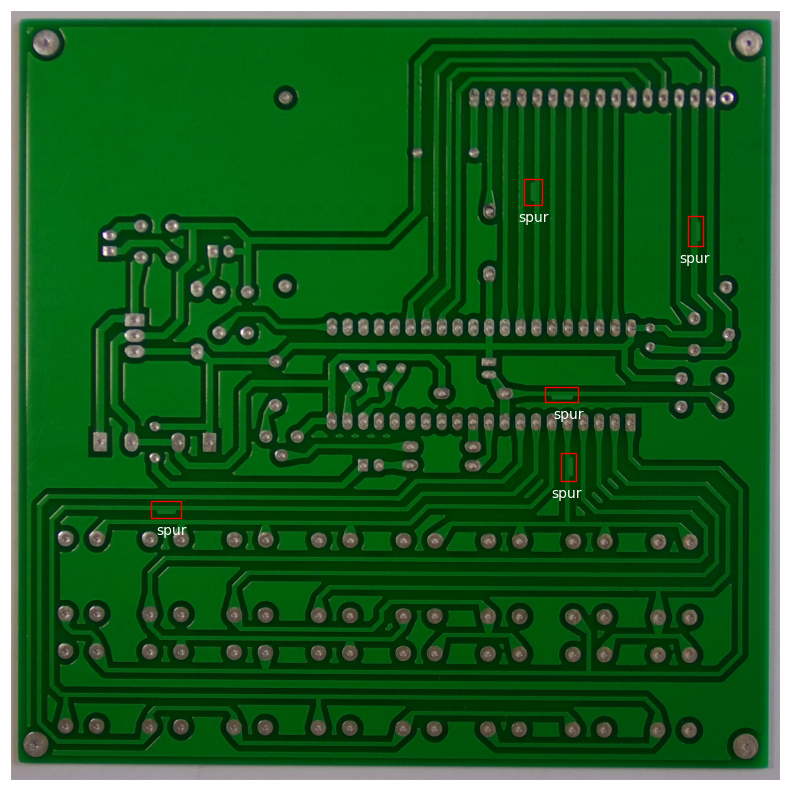

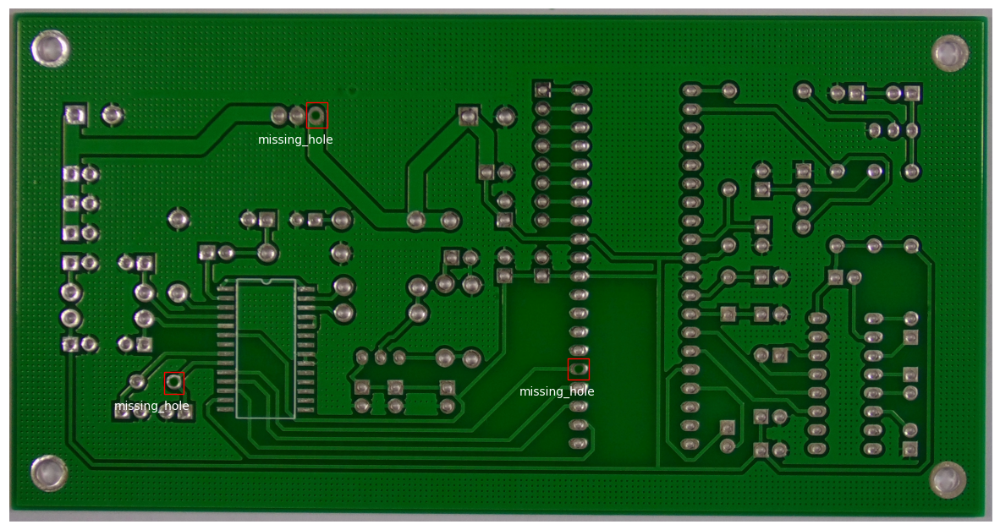

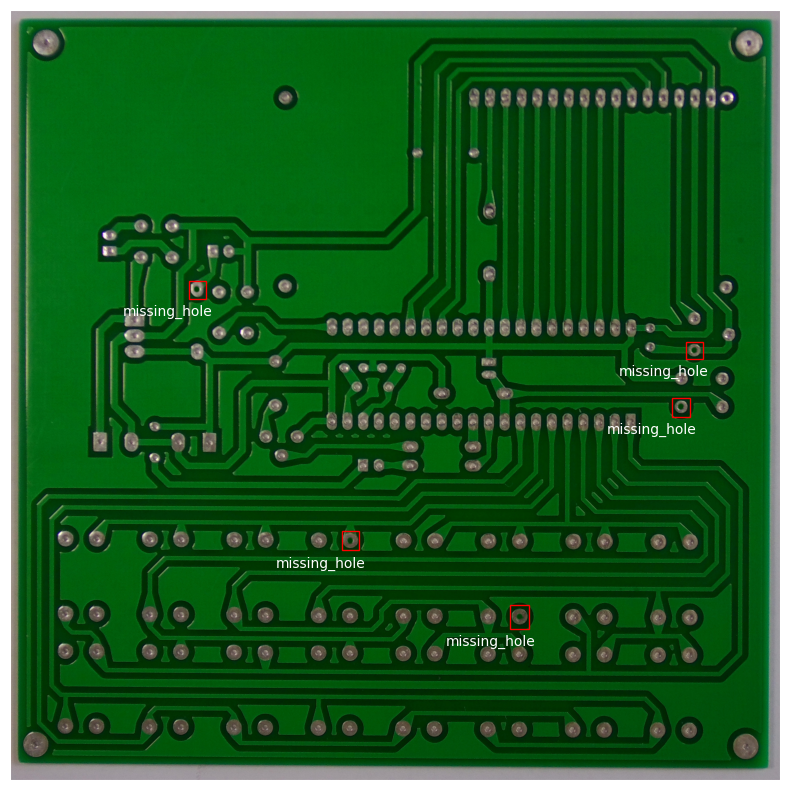

In [34]:
image_path_shuffle=img_path_list
random.shuffle(image_path_shuffle)

visualize_annotations(image_path_shuffle[0:5],df_annot)

# **Image Preprocessing**

In [35]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms, utils

from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import time
import copy
import os

In [36]:
# Basic configuration
print("PyTorch Version:", torch.__version__)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

PyTorch Version: 2.10.0+cu128
Using device: cuda


## **Data Preparation**

In [37]:
img_dir = destination_dir

# To avoid conflicts with the Python keyword 'class', we rename the column
if 'class' in df_annot.columns:
    df_annot = df_annot.rename(columns={'class': 'class_name'})

print("Preview of the provided annotation DataFrame:")
print(df_annot.head())

Preview of the provided annotation DataFrame:
               filename  width  height  class_name  xmin  ymin  xmax  ymax
0  07_mouse_bite_09.jpg   2904    1921  mouse_bite   960   384  1025   469
1  07_mouse_bite_09.jpg   2904    1921  mouse_bite  1617   629  1696   686
2  07_mouse_bite_09.jpg   2904    1921  mouse_bite  1975   700  2044   777
3  07_mouse_bite_09.jpg   2904    1921  mouse_bite  2322  1015  2384  1112
4  07_mouse_bite_09.jpg   2904    1921  mouse_bite   879   877   929   948


In [38]:
# Get the list of classes and number of classes
class_names = sorted(df_annot['class_name'].unique())
num_classes = len(class_names)
print(f"\n{num_classes} classes detected in the DataFrame: {class_names}")


6 classes detected in the DataFrame: ['missing_hole', 'mouse_bite', 'open_circuit', 'short', 'spur', 'spurious_copper']


## **Train/Validation/Test split based**

In [39]:
unique_filenames = df_annot['filename'].unique()
train_files, test_val_files = train_test_split(unique_filenames, test_size=0.3, random_state=42)
val_files, test_files = train_test_split(test_val_files, test_size=0.5, random_state=42) # 0.3 * 0.5 = 0.15

# Create DataFrames for each dataset
train_df = df_annot[df_annot['filename'].isin(train_files)].reset_index(drop=True)
val_df = df_annot[df_annot['filename'].isin(val_files)].reset_index(drop=True)
test_df = df_annot[df_annot['filename'].isin(test_files)].reset_index(drop=True)

dataset_sizes = {'train': len(train_df), 'val': len(val_df), 'test': len(test_df)}
print(f"Number of defects - Training: {dataset_sizes['train']}, Validation: {dataset_sizes['val']}, Test: {dataset_sizes['test']}")

Number of defects - Training: 2063, Validation: 441, Test: 449


## **Data Augmentation and Normalization**

In [40]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)), # Standardize the size of cropped patches
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [41]:
# Custom Dataset Class for Cropping Images
class PCBCropDataset(Dataset):
    def __init__(self, dataframe, image_dir, class_names, transform=None):
        self.df = dataframe
        self.image_dir = image_dir
        self.transform = transform
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(class_names)}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_filename = row['filename']
        box = (row['xmin'], row['ymin'], row['xmax'], row['ymax'])
        label_idx = self.class_to_idx[row['class_name']]

        try:
            img_path = os.path.join(self.image_dir, img_filename)
            image = Image.open(img_path).convert('RGB')
            cropped_image = image.crop(box)
        except FileNotFoundError:
            print(f"Warning: File not found {img_path}. Returning an empty tensor.")
            return torch.zeros((3, 224, 224)), -1 # Handle error case

        if self.transform:
            cropped_image = self.transform(cropped_image)

        return cropped_image, label_idx

## **Creating Datasets and DataLoaders (By using Augmentation)**

In [42]:
train_dataset = PCBCropDataset(train_df, img_dir, class_names, transform=data_transforms['train'])
val_dataset = PCBCropDataset(val_df, img_dir, class_names, transform=data_transforms['val'])
test_dataset = PCBCropDataset(test_df, img_dir, class_names, transform=data_transforms['val'])

In [43]:
# Use a smaller batch size to start and avoid memory errors
batch_size = 16

dataloaders = {
    'train': DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=os.cpu_count()),
    'val': DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=os.cpu_count()),
    'test': DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=os.cpu_count())
}


Visualizing a batch of cropped defect patches...


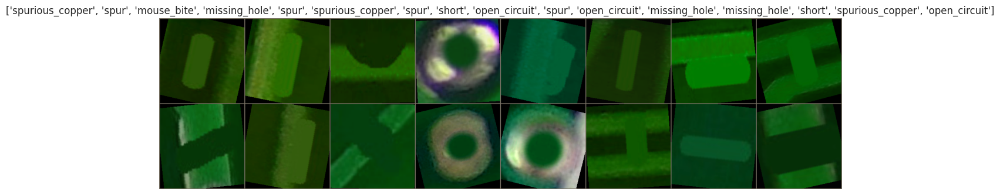

In [44]:
# Visualizing a batch of cropped defect patches
print("\nVisualizing a batch of cropped defect patches...")
inputs, classes_idx = next(iter(dataloaders['train']))
out = utils.make_grid(inputs)

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406]); std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean; inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 8)); plt.imshow(inp)
    if title is not None: plt.title(title)
    plt.axis('off'); plt.show()

imshow(out, title=[class_names[x] for x in classes_idx])


# **Model Building**

## **ResNet18 Model**

In [ ]:
def get_pretrained_model(num_classes):
    model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    # Freeze the weights of the pretrained layers
    for param in model.parameters():
        param.requires_grad = False

    # Replace the final layer to adapt it to our problem
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, num_classes)

    return model.to(device)

In [ ]:
# TRAINING AND VALIDATION FUNCTION
def train_model(model, criterion, optimizer, num_epochs=25, patience=5):
    since = time.time()
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}' + ' | ' + '-'*10)
        for phase in ['train', 'val']:
            model.train() if phase == 'train' else model.eval()
            running_loss, running_corrects = 0.0, 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    if phase == 'train':
                        loss.backward(); optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            print(f'{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_acc'].append(epoch_acc.item())

            if phase == 'val':
                if epoch_loss < best_loss:
                    print(f"Validation loss improved ({best_loss:.4f} -> {epoch_loss:.4f}). Saving model...")
                    best_loss = epoch_loss
                    best_model_wts = copy.deepcopy(model.state_dict())
                    epochs_no_improve = 0
                else:
                    epochs_no_improve += 1

        if epochs_no_improve >= patience:
            print(f"\nEarly stopping triggered after {patience} epochs with no improvement.")
            break
        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s')
    print(f'Best Validation Loss: {best_loss:4f}')

    model.load_state_dict(best_model_wts)
    return model, history

In [ ]:
resnet_model = get_pretrained_model(num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, resnet_model.parameters()), lr=0.001)
best_resnet_model, history = train_model(resnet_model, criterion, optimizer, num_epochs=20, patience=5)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 196MB/s]


Epoch 1/20 | ----------
Train Loss: 1.2911 Acc: 0.5218
Val Loss: 0.8985 Acc: 0.7219
Validation loss improved (inf -> 0.8985). Saving model...

Epoch 2/20 | ----------
Train Loss: 0.8518 Acc: 0.7253
Val Loss: 0.7568 Acc: 0.7263
Validation loss improved (0.8985 -> 0.7568). Saving model...

Epoch 3/20 | ----------
Train Loss: 0.6792 Acc: 0.7849
Val Loss: 0.5035 Acc: 0.8631
Validation loss improved (0.7568 -> 0.5035). Saving model...

Epoch 4/20 | ----------
Train Loss: 0.5905 Acc: 0.8110
Val Loss: 0.4847 Acc: 0.8477
Validation loss improved (0.5035 -> 0.4847). Saving model...

Epoch 5/20 | ----------
Train Loss: 0.5454 Acc: 0.8304
Val Loss: 0.5039 Acc: 0.8344

Epoch 6/20 | ----------
Train Loss: 0.4965 Acc: 0.8479
Val Loss: 0.5051 Acc: 0.8344

Epoch 7/20 | ----------
Train Loss: 0.4866 Acc: 0.8314
Val Loss: 0.4654 Acc: 0.8477
Validation loss improved (0.4847 -> 0.4654). Saving model...

Epoch 8/20 | ----------
Train Loss: 0.4421 Acc: 0.8595
Val Loss: 0.4158 Acc: 0.8631
Validation loss imp

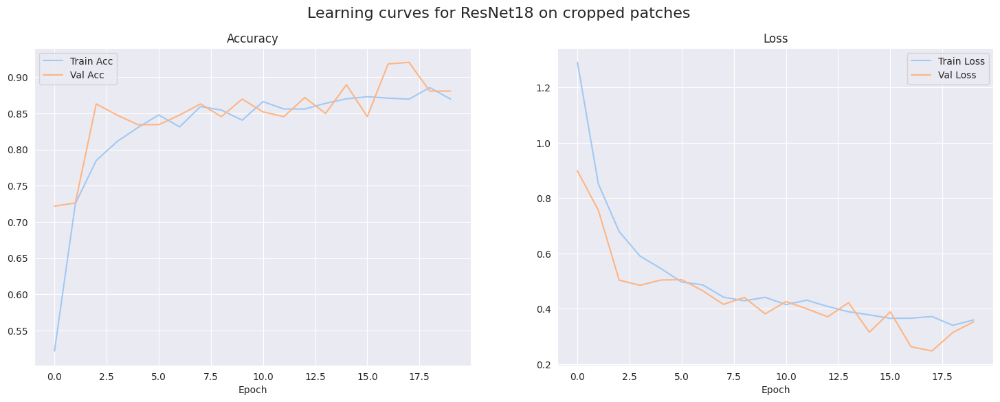

In [ ]:
# ANALYSIS AND EVALUATION OF RESULTS

# Display learning curves
def plot_history(history, model_name):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    fig.suptitle(f"Learning curves for {model_name}", fontsize=16)
    ax1.plot(history['train_acc'], label='Train Acc'); ax1.plot(history['val_acc'], label='Val Acc')
    ax1.set_title('Accuracy'); ax1.set_xlabel('Epoch'); ax1.legend(); ax1.grid(True)
    ax2.plot(history['train_loss'], label='Train Loss'); ax2.plot(history['val_loss'], label='Val Loss')
    ax2.set_title('Loss'); ax2.set_xlabel('Epoch'); ax2.legend(); ax2.grid(True)
    plt.show()

plot_history(history, "ResNet18 on cropped patches")

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc,
    confusion_matrix, classification_report
)
from sklearn.preprocessing import label_binarize

In [ ]:
def evaluate_model_basic(model, dataloader, class_names):
    model.eval()
    y_true, y_pred = [], []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Accuracy, Precision, Recall, F1
    acc = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')

    print(f"Accuracy: {acc:.4f}")
    print(f"Precision (Macro): {precision:.4f}")
    print(f"Recall (Macro): {recall:.4f}")
    print(f"F1-Score (Macro): {f1:.4f}\n")

    print("Classification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix')
    plt.xlabel('Predictions'); plt.ylabel('True Labels')
    plt.show()

    return y_true, y_pred

In [ ]:
def evaluate_model_with_roc(model, dataloader, class_names):
    model.eval()
    y_true, y_score = [], []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)  # probability scores

            y_true.extend(labels.cpu().numpy())
            y_score.extend(probs.cpu().numpy())

    y_true = np.array(y_true)
    y_score = np.array(y_score)

    # One-hot encode true labels for ROC
    y_true_bin = label_binarize(y_true, classes=range(len(class_names)))

    plt.figure(figsize=(10, 8))
    for i in range(len(class_names)):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.4f})")

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Multi-class ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

Accuracy: 0.9197
Precision (Macro): 0.9191
Recall (Macro): 0.9205
F1-Score (Macro): 0.9190

Classification Report:
                 precision    recall  f1-score   support

   missing_hole     0.9859    1.0000    0.9929        70
     mouse_bite     0.9722    0.8861    0.9272        79
   open_circuit     0.8906    0.9344    0.9120        61
          short     0.9176    0.9176    0.9176        85
           spur     0.8028    0.8769    0.8382        65
spurious_copper     0.9452    0.9079    0.9262        76

       accuracy                         0.9197       436
      macro avg     0.9191    0.9205    0.9190       436
   weighted avg     0.9224    0.9197    0.9203       436



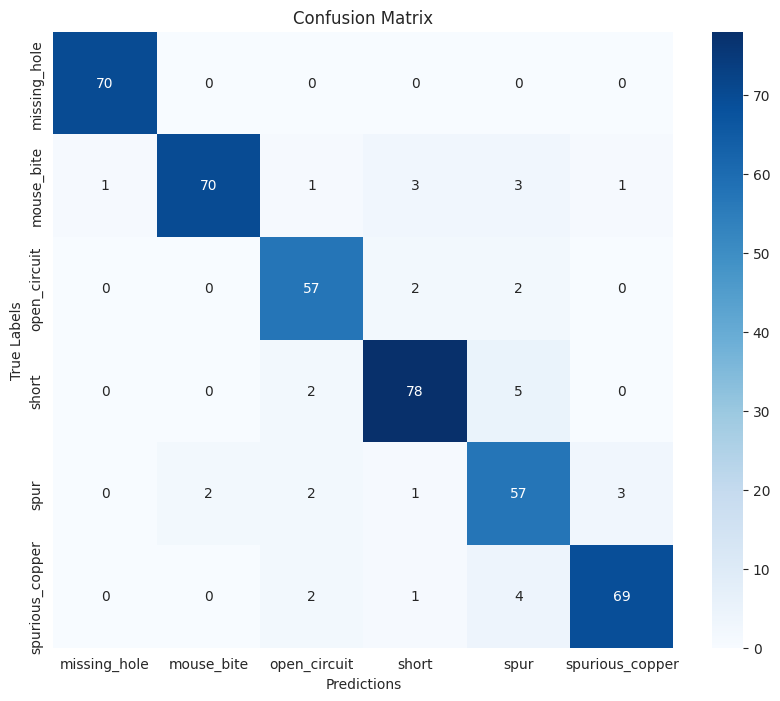

In [ ]:
# Basic metrics
y_true, y_pred = evaluate_model_basic(best_resnet_model, dataloaders['test'], class_names)

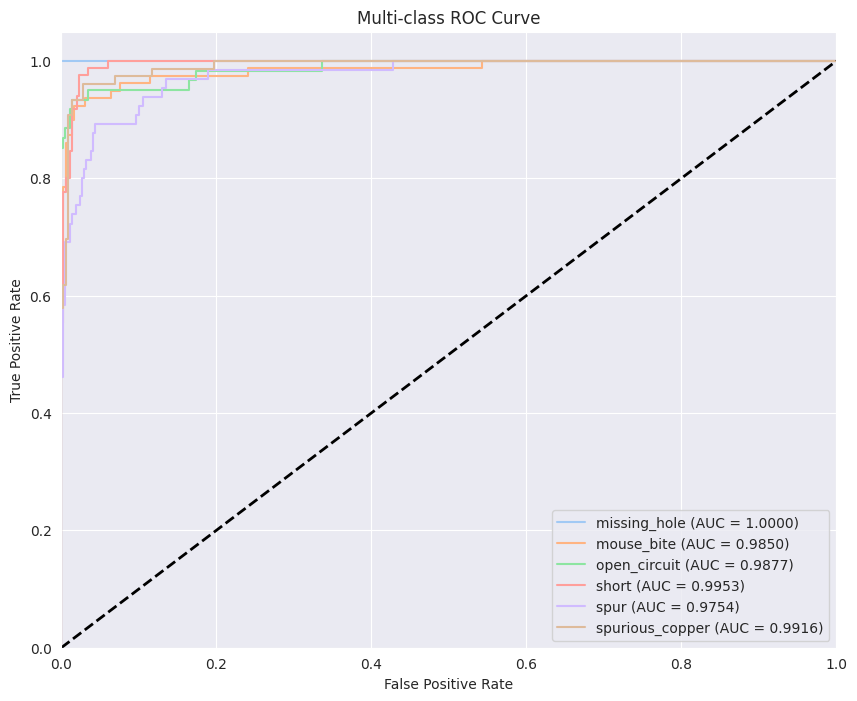

In [ ]:
# ROC curves
evaluate_model_with_roc(best_resnet_model, dataloaders['test'], class_names)

## **Fine-Tuned ResNet Model**

In [ ]:
# Reload the pre-trained model
finetune_model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

# Unfreeze the last layers.
# Parameters are frozen by default, we selectively unfreeze them.
for name, param in finetune_model.named_parameters():
    if "layer3" in name or "layer4" in name or "fc" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False
num_ftrs = finetune_model.fc.in_features
finetune_model.fc = nn.Linear(num_ftrs, num_classes)
finetune_model = finetune_model.to(device)

In [ ]:
# Create an optimizer with different learning rates

optimizer_finetune = optim.Adam([
    {'params': finetune_model.fc.parameters(), 'lr': 1e-3},
    {'params': finetune_model.layer4.parameters(), 'lr': 1e-5}, # Very low lr
    {'params': finetune_model.layer3.parameters(), 'lr': 1e-5}  # Very low lr
])

print("ResNet18 model prepared for fine-tuning.")

ResNet18 model prepared for fine-tuning.


In [ ]:
# Launch training with the same function

best_finetune_model, history_finetune = train_model(
    finetune_model,
    criterion,
    optimizer_finetune,
    num_epochs=5,
    patience=5
)

Epoch 1/5 | ----------
Train Loss: 0.9963 Acc: 0.6400
Val Loss: 0.4305 Acc: 0.8896
Validation loss improved (inf -> 0.4305). Saving model...

Epoch 2/5 | ----------
Train Loss: 0.3087 Acc: 0.9109
Val Loss: 0.2102 Acc: 0.9514
Validation loss improved (0.4305 -> 0.2102). Saving model...

Epoch 3/5 | ----------
Train Loss: 0.1708 Acc: 0.9482
Val Loss: 0.0940 Acc: 0.9713
Validation loss improved (0.2102 -> 0.0940). Saving model...

Epoch 4/5 | ----------
Train Loss: 0.1056 Acc: 0.9700
Val Loss: 0.0609 Acc: 0.9845
Validation loss improved (0.0940 -> 0.0609). Saving model...

Epoch 5/5 | ----------
Train Loss: 0.0787 Acc: 0.9777
Val Loss: 0.0577 Acc: 0.9845
Validation loss improved (0.0609 -> 0.0577). Saving model...

Training complete in 10m 46s
Best Validation Loss: 0.057672


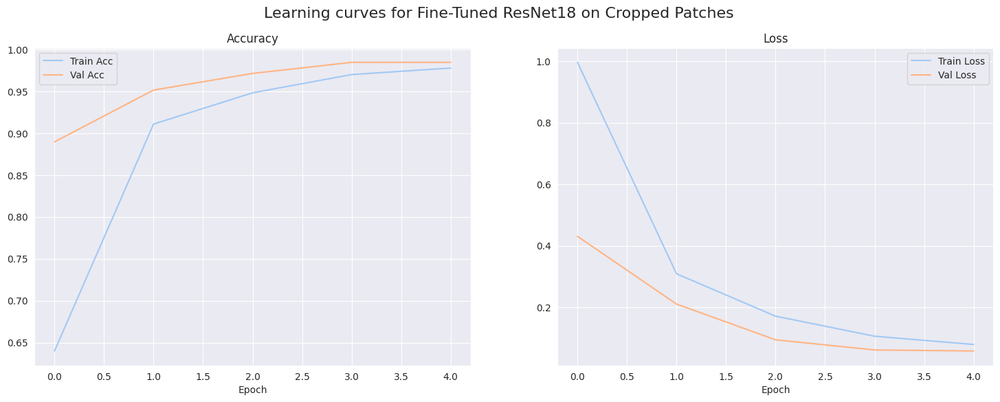

In [ ]:
# Display learning curves for the fine-tuned ResNet18
plot_history(history_finetune, "Fine-Tuned ResNet18")


--- Evaluation of the Fine-Tuned ResNet18 Model ---
Accuracy: 0.9862
Precision (Macro): 0.9873
Recall (Macro): 0.9852
F1-Score (Macro): 0.9860

Classification Report:
                 precision    recall  f1-score   support

   missing_hole     1.0000    1.0000    1.0000        70
     mouse_bite     0.9405    1.0000    0.9693        79
   open_circuit     1.0000    1.0000    1.0000        61
          short     1.0000    0.9882    0.9941        85
           spur     0.9836    0.9231    0.9524        65
spurious_copper     1.0000    1.0000    1.0000        76

       accuracy                         0.9862       436
      macro avg     0.9873    0.9852    0.9860       436
   weighted avg     0.9868    0.9862    0.9862       436



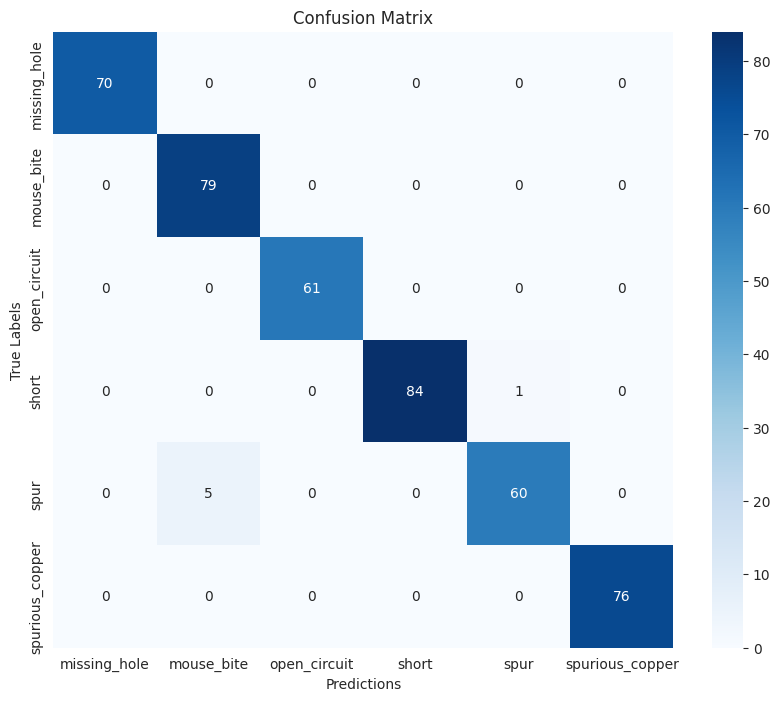

In [ ]:
print("\n--- Evaluation of the Fine-Tuned ResNet18 Model ---")
# Evaluate accuracy, precision, recall, F1, and show confusion matrix
y_true_finetune, y_pred_finetune = evaluate_model_basic(
    best_finetune_model,
    dataloaders['test'],
    class_names
)

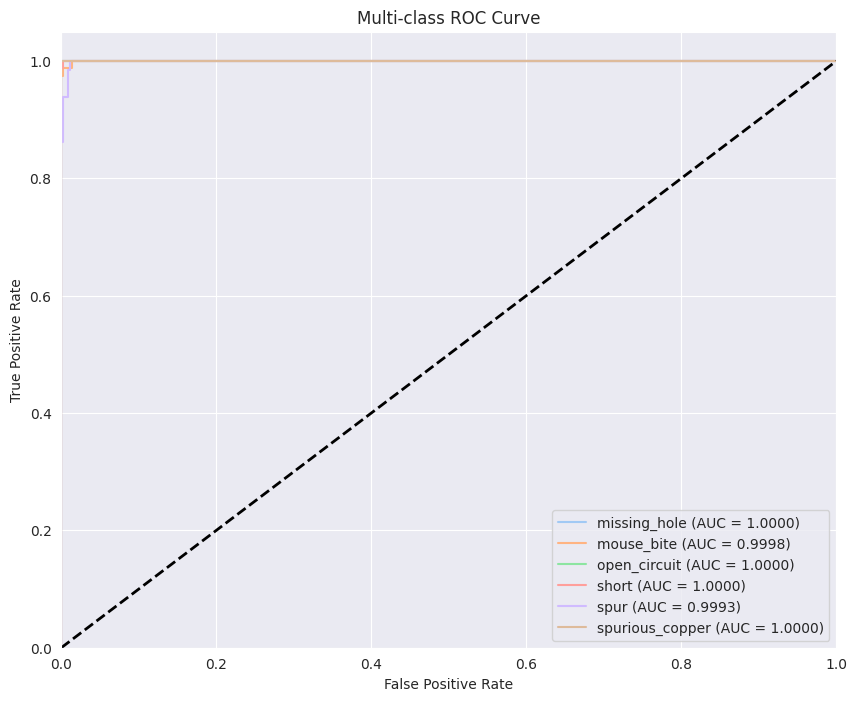

In [ ]:
# Evaluate and plot ROC curves for multi-class
evaluate_model_with_roc(
    best_finetune_model,
    dataloaders['test'],
    class_names
)

# **VGG16 Model**

In [45]:
# TRAINING AND VALIDATION FUNCTION FOR VGG16

def train_vgg16(model, criterion, optimizer, num_epochs=25, patience=5):
    since = time.time()

    # Changed history name → vgg16_history
    vgg16_history = {
        'train_loss': [],
        'train_acc': [],
        'val_loss': [],
        'val_acc': []
    }

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs} | ' + '-'*10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # Store in new history variable
            vgg16_history[f'{phase}_loss'].append(epoch_loss)
            vgg16_history[f'{phase}_acc'].append(epoch_acc.item())

            # Validation check
            if phase == 'val':
                if epoch_loss < best_loss:
                    print(f"Validation loss improved ({best_loss:.4f} -> {epoch_loss:.4f}). Saving model...")
                    best_loss = epoch_loss
                    best_model_wts = copy.deepcopy(model.state_dict())
                    epochs_no_improve = 0
                else:
                    epochs_no_improve += 1

        # Early stopping
        if epochs_no_improve >= patience:
            print(f"\nEarly stopping triggered after {patience} epochs with no improvement.")
            break

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s')
    print(f'Best Validation Loss: {best_loss:.4f}')

    model.load_state_dict(best_model_wts)

    return model, vgg16_history

In [46]:
import torch
import torch.nn as nn
import torchvision.models as models

# Load pretrained VGG16
model = models.vgg16(pretrained=True)

# Freeze feature layers
for param in model.features.parameters():
    param.requires_grad = False

# Modify classifier (VERY IMPORTANT)
num_classes = len(class_names)

model.classifier[6] = nn.Linear(4096, num_classes)

model = model.to(device)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:08<00:00, 64.9MB/s]


In [47]:
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.classifier.parameters(), lr=0.001)

In [48]:
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.classifier.parameters(), lr=0.001)

In [50]:
model, vgg16_history = train_vgg16(
    model,
    criterion,
    optimizer,
    num_epochs=20,
    patience=5
)

Epoch 1/20 | ----------
Train Loss: 1.0933 Acc: 0.6791
Val Loss: 0.2830 Acc: 0.9093
Validation loss improved (inf -> 0.2830). Saving model...

Epoch 2/20 | ----------
Train Loss: 0.7248 Acc: 0.8575
Val Loss: 0.3866 Acc: 0.9025

Epoch 3/20 | ----------
Train Loss: 0.7395 Acc: 0.8803
Val Loss: 0.0621 Acc: 0.9819
Validation loss improved (0.2830 -> 0.0621). Saving model...

Epoch 4/20 | ----------
Train Loss: 0.6546 Acc: 0.8880
Val Loss: 0.1637 Acc: 0.9615

Epoch 5/20 | ----------
Train Loss: 0.5860 Acc: 0.9152
Val Loss: 0.2349 Acc: 0.9569

Epoch 6/20 | ----------
Train Loss: 0.4316 Acc: 0.9321
Val Loss: 0.1368 Acc: 0.9751

Epoch 7/20 | ----------
Train Loss: 0.4990 Acc: 0.9331
Val Loss: 0.1439 Acc: 0.9660

Epoch 8/20 | ----------
Train Loss: 0.5077 Acc: 0.9341
Val Loss: 0.1596 Acc: 0.9751

Early stopping triggered after 5 epochs with no improvement.
Training complete in 20m 13s
Best Validation Loss: 0.0621


In [59]:
import matplotlib.pyplot as plt

def plot_learning_curves(history):
    epochs = range(1, len(history['train_loss']) + 1)

    # ---- Loss Curve ----
    plt.figure()
    plt.plot(epochs, history['train_loss'], label='Train Loss')
    plt.plot(epochs, history['val_loss'], label='Validation Loss')
    plt.title("Training vs Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    # ---- Accuracy Curve ----
    plt.figure()
    plt.plot(epochs, history['train_acc'], label='Train Accuracy')
    plt.plot(epochs, history['val_acc'], label='Validation Accuracy')
    plt.title("Training vs Validation Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

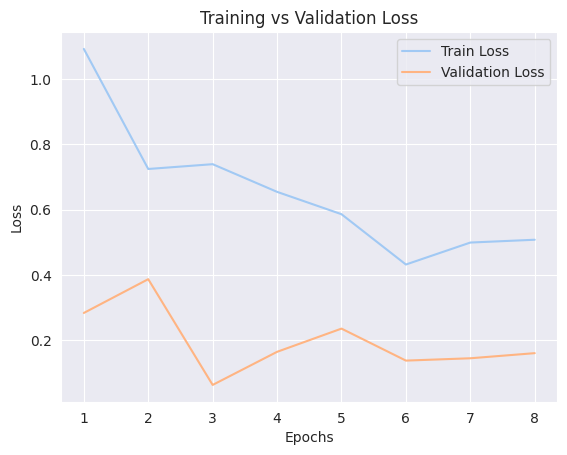

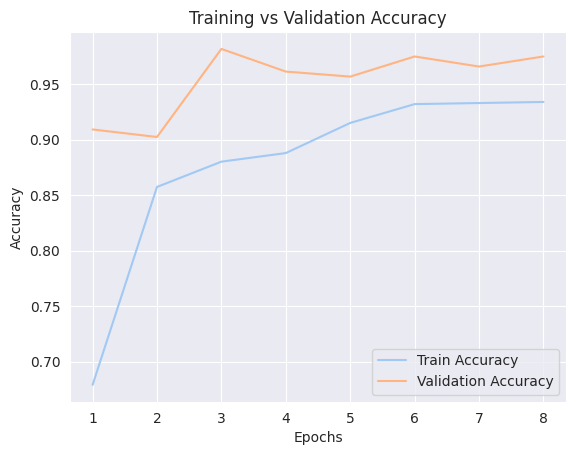

In [60]:
plot_learning_curves(vgg16_history)

In [51]:
def evaluate_model(model, dataloader):
    model.eval()

    running_corrects = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            running_corrects += torch.sum(preds == labels.data)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    accuracy = running_corrects.double() / len(dataloader.dataset)

    print(f"\nTest Accuracy: {accuracy:.4f}")

    return accuracy, all_preds, all_labels

In [52]:
test_acc, y_pred, y_true = evaluate_model(model, dataloaders['test'])


Test Accuracy: 0.9710


In [53]:
from sklearn.metrics import confusion_matrix, classification_report

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
print("\nConfusion Matrix:\n", cm)


Classification Report:
                 precision    recall  f1-score   support

   missing_hole       1.00      1.00      1.00        73
     mouse_bite       0.97      1.00      0.98        90
   open_circuit       1.00      0.96      0.98        68
          short       1.00      0.97      0.99        75
           spur       0.93      0.96      0.95        72
spurious_copper       0.93      0.93      0.93        71

       accuracy                           0.97       449
      macro avg       0.97      0.97      0.97       449
   weighted avg       0.97      0.97      0.97       449


Confusion Matrix:
 [[73  0  0  0  0  0]
 [ 0 90  0  0  0  0]
 [ 0  3 65  0  0  0]
 [ 0  0  0 73  0  2]
 [ 0  0  0  0 69  3]
 [ 0  0  0  0  5 66]]


In [54]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure()
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)

    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.show()

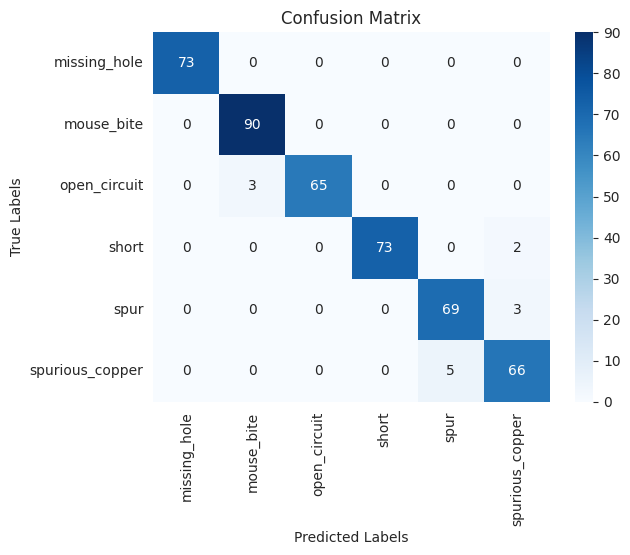

In [55]:
plot_confusion_matrix(y_true, y_pred, class_names)

In [56]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np

def plot_roc_curve(model, dataloader, num_classes):
    model.eval()

    all_probs = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)

            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)

            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)

    # Binarize labels
    y_true_bin = label_binarize(all_labels, classes=range(num_classes))

    plt.figure()

    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], all_probs[:, i])
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], linestyle='--')  # diagonal line
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve (Multi-class)")
    plt.legend()
    plt.show()

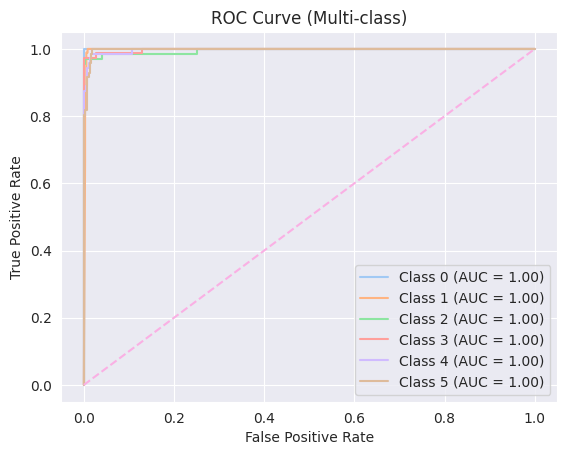

In [57]:
plot_roc_curve(model, dataloaders['test'], num_classes=len(class_names))

# **Vision Transformer Model (ViT)**

In [61]:
import torch
import torch.nn as nn
import torchvision.models as models

# Load pretrained Vision Transformer
model = models.vit_b_16(pretrained=True)

# Modify head for your dataset
num_classes = len(class_names)
model.heads.head = nn.Linear(model.heads.head.in_features, num_classes)

model = model.to(device)

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


100%|██████████| 330M/330M [00:06<00:00, 57.5MB/s]


In [62]:
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)

In [63]:
model, vit_history = train_vgg16(
    model,
    criterion,
    optimizer,
    num_epochs=25,
    patience=5
)

Epoch 1/25 | ----------
Train Loss: 1.5743 Acc: 0.3054
Val Loss: 1.4600 Acc: 0.4036
Validation loss improved (inf -> 1.4600). Saving model...

Epoch 2/25 | ----------
Train Loss: 1.4511 Acc: 0.3388
Val Loss: 1.4348 Acc: 0.4059
Validation loss improved (1.4600 -> 1.4348). Saving model...

Epoch 3/25 | ----------
Train Loss: 1.4071 Acc: 0.3703
Val Loss: 1.3113 Acc: 0.4308
Validation loss improved (1.4348 -> 1.3113). Saving model...

Epoch 4/25 | ----------
Train Loss: 1.3431 Acc: 0.4048
Val Loss: 1.3373 Acc: 0.3560

Epoch 5/25 | ----------
Train Loss: 1.3473 Acc: 0.3776
Val Loss: 1.3292 Acc: 0.3333

Epoch 6/25 | ----------
Train Loss: 1.2415 Acc: 0.4464
Val Loss: 1.1996 Acc: 0.4671
Validation loss improved (1.3113 -> 1.1996). Saving model...

Epoch 7/25 | ----------
Train Loss: 1.1597 Acc: 0.4784
Val Loss: 1.1662 Acc: 0.4558
Validation loss improved (1.1996 -> 1.1662). Saving model...

Epoch 8/25 | ----------
Train Loss: 1.1179 Acc: 0.4983
Val Loss: 1.1088 Acc: 0.4785
Validation loss imp

In [64]:
import matplotlib.pyplot as plt

def plot_vit_learning_curves(history):
    epochs = range(1, len(history['train_loss']) + 1)

    # ---- Loss Curve ----
    plt.figure()
    plt.plot(epochs, history['train_loss'], label='Train Loss')
    plt.plot(epochs, history['val_loss'], label='Validation Loss')
    plt.title("ViT Training vs Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    # ---- Accuracy Curve ----
    plt.figure()
    plt.plot(epochs, history['train_acc'], label='Train Accuracy')
    plt.plot(epochs, history['val_acc'], label='Validation Accuracy')
    plt.title("ViT Training vs Validation Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

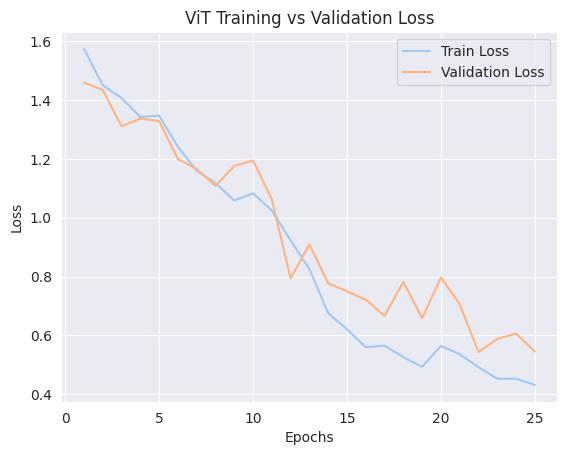

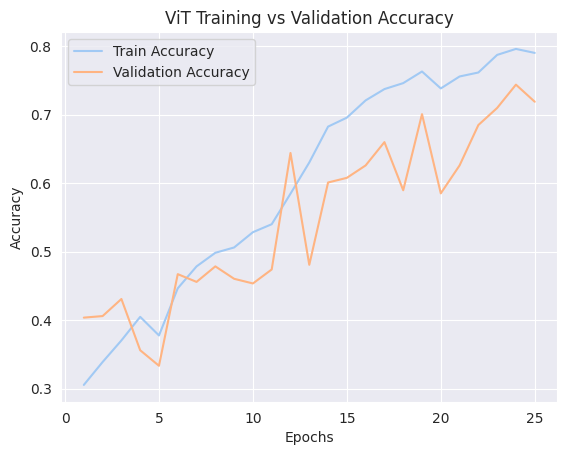

In [65]:
plot_vit_learning_curves(vit_history)

In [66]:
test_acc, y_pred, y_true = evaluate_model(model, dataloaders['test'])


Test Accuracy: 0.8085


In [67]:
from sklearn.metrics import classification_report

def print_classification_report(y_true, y_pred, class_names):
    print("\nClassification Report:\n")
    print(classification_report(y_true, y_pred, target_names=class_names))

In [68]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import numpy as np

def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure()
    plt.imshow(cm)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")

    plt.xticks(np.arange(len(class_names)), class_names, rotation=45)
    plt.yticks(np.arange(len(class_names)), class_names)

    # Annotate values
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            plt.text(j, i, cm[i, j], ha="center", va="center")

    plt.colorbar()
    plt.tight_layout()
    plt.show()

In [69]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_curve(model, dataloader, num_classes):
    model.eval()

    all_probs = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)

            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)

            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)

    # Binarize labels
    y_true_bin = label_binarize(all_labels, classes=range(num_classes))

    plt.figure()

    # Per-class ROC
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], all_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {roc_auc:.2f})")

    # Micro-average ROC
    fpr, tpr, _ = roc_curve(y_true_bin.ravel(), all_probs.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, linestyle='--', label=f"Micro-average (AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], linestyle=':')  # diagonal

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve (Multi-class)")
    plt.legend()
    plt.show()

In [71]:
# Evaluate first
test_acc, y_pred, y_true = evaluate_model(model, dataloaders['test'])


Test Accuracy: 0.8085


In [72]:
# 1. Classification report
print_classification_report(y_true, y_pred, class_names)


Classification Report:

                 precision    recall  f1-score   support

   missing_hole       0.99      1.00      0.99        73
     mouse_bite       0.85      0.56      0.67        90
   open_circuit       0.62      0.90      0.73        68
          short       0.72      0.92      0.81        75
           spur       0.97      0.81      0.88        72
spurious_copper       0.85      0.73      0.79        71

       accuracy                           0.81       449
      macro avg       0.83      0.82      0.81       449
   weighted avg       0.83      0.81      0.81       449



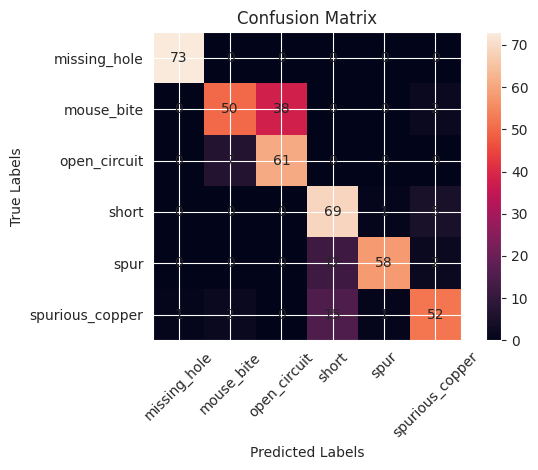

In [73]:
# 2. Confusion matrix
plot_confusion_matrix(y_true, y_pred, class_names)

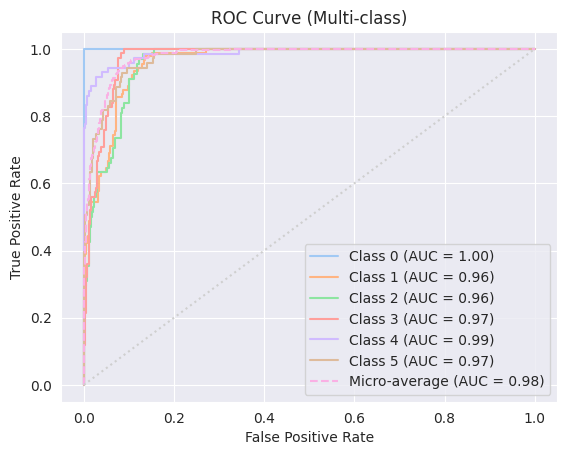

In [74]:
# 3. ROC curve
plot_roc_curve(model, dataloaders['test'], num_classes=len(class_names))